In [1]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

In [2]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.2/265.2 MB 2.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.44.0.3-py2.py3-none-any.whl size=265293968 sha256=123f0c605b0caaeadcda70564e8da51abc60228856c6693a648c3d5e3a2d9eda
  Stored in directory: /root/.cache/pip/wheels/77/9a/1c/2da26f943fd46b57f3c20b54847b936b9152b831dc7447cf71
Successfully built h2o


In [3]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [4]:
min_mem_size=6
run_time=222

In [5]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

6


In [6]:
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:27924..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp8iavjajm
  JVM stdout: /tmp/tmp8iavjajm/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp8iavjajm/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:27924
Connecting to H2O server at http://127.0.0.1:27924 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,1 month and 29 days
H2O_cluster_name:,H2O_from_python_unknownUser_l8rvpq
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [7]:
# Import the processed data from notebook One
url = "https://raw.githubusercontent.com/chinm4y/csv/main/premierLeague%20-%20Sheet1.csv"
df = h2o.import_file(path = url)
dff = pd.read_csv('https://raw.githubusercontent.com/chinm4y/csv/main/premierLeague%20-%20Sheet1.csv')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [8]:
dff.head()

,Match_Name,Match_Date,Team,Team_Logo,Manager,Captain,Score,Penalties,Fouls,Corners,...,Possession,PassingAccuracy,SucPass,NumofPass,ShotsAccuracy,SucShots,NumofShots,SavesAccuracy,SucSaves,NumofSaves
0,Liverpool vs. Norwich City,2019-08-09 00:00:00,Liverpool,https://d2p3bygnnzw9w3.cloudfront.net/req/2020...,Jürgen Klopp,Jordan Henderson,4,0,10,11,...,0.57,0,409,521,0.47,7,15,0.83,5,6
1,Liverpool vs. Norwich City,2019-08-09 00:00:00,Norwich City,https://d2p3bygnnzw9w3.cloudfront.net/req/2020...,Daniel Farke,Grant Hanley,1,0,12,2,...,0.43,0,304,395,0.46,6,13,0.42,3,7
2,West Ham United vs. Manchester City,2019-08-10 00:00:00,West Ham United,https://d2p3bygnnzw9w3.cloudfront.net/req/2020...,Manuel Pellegrini,Aaron Cresswell,0,0,11,1,...,0.43,0,347,428,0.60,3,5,0.50,4,8
3,West Ham United vs. Manchester City,2019-08-10 00:00:00,Manchester City,https://d2p3bygnnzw9w3.cloudfront.net/req/2020...,Pep Guardiola,David Silva,5,0,15,1,...,0.57,0,495,564,0.62,8,13,1.00,3,3
4,Burnley vs. Southampton,2019-08-10 00:00:00,Burnley,https://d2p3bygnnzw9w3.cloudfront.net/req/2020...,Sean Dyche,Ben Mee,3,0,6,2,...,0.46,0,214,346,0.44,4,9,1.00,3,3


In [9]:
dff.describe()

,Score,Penalties,Fouls,Corners,Crosses,Touches,Tackles,Interceptions,Aerials Won,Clearances,...,Possession,PassingAccuracy,SucPass,NumofPass,ShotsAccuracy,SucShots,NumofShots,SavesAccuracy,SucSaves,NumofSaves
count,760.000000,760.0,760.000000,760.000000,760.000000,760.000000,760.000000,760.000000,760.000000,760.000000,...,760.000000,760.0,760.000000,760.000000,760.000000,760.000000,760.000000,760.000000,760.000000,760.000000
mean,1.360526,0.0,12.601316,5.342105,12.064474,610.294737,17.698684,7.213158,18.436842,26.836842,...,0.500039,0.0,387.655263,490.727632,0.338158,4.071053,12.213158,0.659763,2.809211,4.071053
std,1.233703,0.0,4.052065,3.063030,5.676598,133.400227,5.389444,3.717896,7.415130,11.888468,...,0.124461,0.0,138.971299,138.141822,0.166533,2.406667,5.346180,0.287886,1.896997,2.406667
min,0.000000,0.0,2.000000,0.000000,0.000000,362.000000,4.000000,0.000000,2.000000,3.000000,...,0.210000,0.0,150.000000,215.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,0.000000,0.0,10.000000,3.000000,8.000000,509.000000,14.000000,5.000000,13.000000,18.000000,...,0.417500,0.0,283.000000,388.750000,0.230000,2.000000,8.000000,0.500000,1.000000,2.000000
50%,1.000000,0.0,12.000000,5.000000,11.000000,596.000000,17.000000,7.000000,18.000000,25.000000,...,0.500000,0.0,371.500000,477.500000,0.330000,4.000000,12.000000,0.660000,3.000000,4.000000
75%,2.000000,0.0,15.000000,7.000000,16.000000,694.750000,21.000000,9.000000,23.000000,34.250000,...,0.582500,0.0,468.000000,572.750000,0.430000,6.000000,15.000000,1.000000,4.000000,6.000000
max,9.000000,0.0,27.000000,18.000000,40.000000,1081.000000,34.000000,25.000000,44.000000,76.000000,...,0.790000,0.0,891.000000,995.000000,1.000000,15.000000,31.000000,1.000000,11.000000,15.000000


In [10]:
df.types

{'Match_Name': 'enum',
 'Match_Date': 'time',
 'Team': 'enum',
 'Team_Logo': 'enum',
 'Manager': 'enum',
 'Captain': 'enum',
 'Score': 'int',
 'Penalties': 'int',
 'Fouls': 'int',
 'Corners': 'int',
 'Crosses': 'int',
 'Touches': 'int',
 'Tackles': 'int',
 'Interceptions': 'int',
 'Aerials Won': 'int',
 'Clearances': 'int',
 'Offsides': 'int',
 'Goal Kicks': 'int',
 'Throw Ins': 'int',
 'Long Balls': 'int',
 'YellowCard': 'int',
 'RedCard': 'int',
 'YellowRed': 'int',
 'Possession': 'real',
 'PassingAccuracy': 'int',
 'SucPass': 'int',
 'NumofPass': 'int',
 'ShotsAccuracy': 'real',
 'SucShots': 'int',
 'NumofShots': 'int',
 'SavesAccuracy': 'real',
 'SucSaves': 'int',
 'NumofSaves': 'int'}

In [11]:
df.shape

(760, 33)

In [12]:
# Create a 80/20 train/test split
pct_rows=0.80
df_train, df_test = df.split_frame([pct_rows])

In [13]:
print(df_train.shape)
print(df_test.shape)

(613, 33)
(147, 33)


In [14]:
#Display all columns in X
X=df.columns
print(X)

['Match_Name', 'Match_Date', 'Team', 'Team_Logo', 'Manager', 'Captain', 'Score', 'Penalties', 'Fouls', 'Corners', 'Crosses', 'Touches', 'Tackles', 'Interceptions', 'Aerials Won', 'Clearances', 'Offsides', 'Goal Kicks', 'Throw Ins', 'Long Balls', 'YellowCard', 'RedCard', 'YellowRed', 'Possession', 'PassingAccuracy', 'SucPass', 'NumofPass', 'ShotsAccuracy', 'SucShots', 'NumofShots', 'SavesAccuracy', 'SucSaves', 'NumofSaves']


In [19]:

y_numeric = df['Score']  # Dependent variable
X = df.drop('Score', axis=1)  # Independent variables, removing 'Score'


print(X.columns)


['Match_Name', 'Match_Date', 'Team', 'Team_Logo', 'Manager', 'Captain', 'Penalties', 'Fouls', 'Corners', 'Crosses', 'Touches', 'Tackles', 'Interceptions', 'Aerials Won', 'Clearances', 'Offsides', 'Goal Kicks', 'Throw Ins', 'Long Balls', 'YellowCard', 'RedCard', 'YellowRed', 'Possession', 'PassingAccuracy', 'SucPass', 'NumofPass', 'ShotsAccuracy', 'SucShots', 'NumofShots', 'SavesAccuracy', 'SucSaves', 'NumofSaves']


In [20]:
dfpd=pd.read_csv("https://raw.githubusercontent.com/chinm4y/csv/main/premierLeague%20-%20Sheet1.csv")

In [21]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [24]:
# Correct usage
aml.train(x=X.columns, y='Score', training_frame=df_train)


AutoML progress: |
00:31:14.311: _train param, Dropping bad and constant columns: [PassingAccuracy, Penalties]

██
00:31:19.621: _train param, Dropping bad and constant columns: [PassingAccuracy, Penalties]

█
00:31:22.310: _train param, Dropping bad and constant columns: [PassingAccuracy, Penalties]

█
00:31:25.999: _train param, Dropping unused columns: [PassingAccuracy, Penalties]
00:31:26.281: _train param, Dropping bad and constant columns: [PassingAccuracy, Penalties]

█
00:31:29.945: _train param, Dropping bad and constant columns: [PassingAccuracy, Penalties]

██
00:31:35.628: _train param, Dropping bad and constant columns: [PassingAccuracy, Penalties]

█
00:31:39.541: _train param, Dropping bad and constant columns: [PassingAccuracy, Penalties]


00:31:42.132: _train param, Dropping bad and constant columns: [PassingAccuracy, Penalties]

█
00:31:44.951: _train param, Dropping unused columns: [PassingAccuracy, Penalties]
00:31:45.212: _train param, Dropping unused columns: [Pa

key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/6
# GBM base models (used / total),0/1
# XGBoost base models (used / total),1/1
# GLM base models (used / total),1/1
# DeepLearning base models (used / total),1/1
# DRF base models (used / total),1/2
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [25]:
print(aml.leaderboard)

model_id                                                    rmse       mse       mae       rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_1_20240219_03113  0.921559  0.849271  0.709516    0.412318                  0.849271
StackedEnsemble_AllModels_2_AutoML_1_20240219_03113     0.922759  0.851483  0.712537    0.412919                  0.851483
StackedEnsemble_BestOfFamily_3_AutoML_1_20240219_03113  0.92778   0.860775  0.713309    0.414448                  0.860775
GLM_1_AutoML_1_20240219_03113                           0.928256  0.861659  0.722818    0.42837                   0.861659
StackedEnsemble_AllModels_1_AutoML_1_20240219_03113     0.92962   0.864193  0.718935    0.421118                  0.864193
StackedEnsemble_BestOfFamily_2_AutoML_1_20240219_03113  0.930906  0.866586  0.721293    0.422011                  0.866586
StackedEnsemble_BestOfFamily_1_AutoML_1_20240219_03113  0.932758  0.870038  0.722966    0.421047                  0.870038
StackedEnsemble_

In [30]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF
Multic = dfpd[['Corners', 'YellowCard', 'RedCard', 'YellowRed', 'Possession',
    'ShotsAccuracy', 'SucShots', 'SavesAccuracy', 'SucSaves', 'NumofSaves', 'Fouls', 'Long Balls']]
#Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif

,variables,VIF
0,Corners,5.576836
1,YellowCard,3.471497
2,RedCard,1.066909
3,YellowRed,1.067518
4,Possession,17.209990
5,ShotsAccuracy,9.694149
6,SucShots,9.188415
7,SavesAccuracy,12.545785
8,SucSaves,28.834694
9,NumofSaves,25.071898


Upon computing the Variance Inflation Factor (VIF) for selected variables in our dataset, we observed significant multicollinearity among some of the variables. The VIF calculation helps identify variables that are highly correlated with others, with a threshold value above 10 indicating strong multicollinearity. The results are as follows:

Possession shows a VIF of 17.21, indicating a strong correlation with other variables.
SavesAccuracy has a VIF of 12.55, also suggesting significant multicollinearity.
SucSaves and NumofSaves exhibit exceptionally high VIF values of 28.83 and 25.07, respectively, highlighting their strong interdependencies.
Long Balls with a VIF of 16.74 further indicates considerable correlation with other metrics.
Given these findings, it is evident that "SucSaves" and "NumofSaves" specify similar aspects of a team's defensive performance, as both relate to successful saves made during a match. Similarly, "Possession" and "Long Balls" might be contributing to multicollinearity due to their association with the overall control and strategy in the game. To address this issue and improve the model's accuracy, we will drop the variables "SucSaves", "NumofSaves", and "Long Balls". We have decided not to drop "Possession" and "SavesAccuracy" despite their high VIF values because these variables represent crucial aspects of football match dynamics important for our analysis.

In [41]:
import statsmodels.formula.api as smf


model_formula = 'Score~Corners + YellowCard + RedCard + Possession + ShotsAccuracy + SucShots + SavesAccuracy + SucSaves + NumofSaves + Fouls'


results = smf.ols(model_formula, data=dfpd).fit()

summary = results.summary()
print(summary)


                            OLS Regression Results                            
Dep. Variable:                  Score   R-squared:                       0.411
Model:                            OLS   Adj. R-squared:                  0.403
Method:                 Least Squares   F-statistic:                     52.34
Date:                Mon, 19 Feb 2024   Prob (F-statistic):           1.59e-79
Time:                        01:00:26   Log-Likelihood:                -1036.1
No. Observations:                 760   AIC:                             2094.
Df Residuals:                     749   BIC:                             2145.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.5609      0.274      2.046

Considering the significant value of 0.06 because predicting if the match is a winning match or a loosing match is not that critical,

The corners have the p walve of 0 which is less and hence it is a significant feature.
yellow cards have the p value of 0.09 which is more and hence they are cnsidered to be not a significant feature
red cards have the p value of 0.04, a significant feature
yellow+red have the p value 0.8, not a significant feature.
possession has the p value of 0.5, not a significant feature.
successfull shots has the p value of 0 which is very less and is a significant feature.
same can be said aboout succ saves, num of saves and shot accuracy.

Dropping unnecessary values

In [49]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF
Multic = dfpd[['Corners', 'YellowCard', 'RedCard',
     'SucShots', 'SucSaves', 'NumofSaves']]
#Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif

,variables,VIF
0,Corners,3.765062
1,YellowCard,2.434305
2,RedCard,1.052686
3,SucShots,3.446047
4,SucSaves,14.105019
5,NumofSaves,15.005295


In [50]:
import statsmodels.formula.api as smf #OLS model Library
results = smf.ols('Score~Corners + YellowCard + RedCard   + SucShots + SucSaves + NumofSaves', data=dfpd).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Score   R-squared:                       0.410
Model:                            OLS   Adj. R-squared:                  0.406
Method:                 Least Squares   F-statistic:                     87.33
Date:                Mon, 19 Feb 2024   Prob (F-statistic):           5.20e-83
Time:                        01:08:55   Log-Likelihood:                -1036.8
No. Observations:                 760   AIC:                             2088.
Df Residuals:                     753   BIC:                             2120.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.6085      0.125      4.849      0.000       0.362       0.855
Corners       -0.0551      0.012     -4.597      0.000      -0.079      -0.032
YellowCard    -0.0466      0.028     -1.670      0.095      -0.101       0.008
RedCard       -0.3636      0.185     -1.969      0.049      -0.726      -0.001
SucShots       0.3172      0.016     20.413      0.000       0.287       0.348
SucSaves       0.1502      0.038      3.911      0.000       0.075       0.226
NumofSaves    -0.1411      0.031     -4.606      0.000      -0.201      -0.081
==============================================================================
Omnibus:                       54.200   Durbin-Watson:                   1.894
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               74.688
Skew:                           0.579   Prob(JB):                     6.05e-17
Kurtosis:                       4.010   Cond. No.                         48.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [51]:
model_formula = 'Score ~ Corners + YellowCard + RedCard + SucShots + SucSaves + NumofSaves'
results_revised = smf.ols(model_formula, data=dfpd).fit()
print(results_revised.summary())


                            OLS Regression Results                            
Dep. Variable:                  Score   R-squared:                       0.410
Model:                            OLS   Adj. R-squared:                  0.406
Method:                 Least Squares   F-statistic:                     87.33
Date:                Mon, 19 Feb 2024   Prob (F-statistic):           5.20e-83
Time:                        01:09:14   Log-Likelihood:                -1036.8
No. Observations:                 760   AIC:                             2088.
Df Residuals:                     753   BIC:                             2120.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.6085      0.125      4.849      0.0

In [55]:
dfpd.corr()

,Score,Penalties,Fouls,Corners,Crosses,Touches,Tackles,Interceptions,Aerials Won,Clearances,...,SucPass,NumofPass,ShotsAccuracy,SucShots,NumofShots,SavesAccuracy,SucSaves,NumofSaves,Corners_ShotsAccuracy,Log_SucShots
Score,1.000000,NaN,-0.041842,0.075401,0.040699,0.241874,0.033599,0.019991,-0.064334,-0.023382,...,0.251106,0.234456,0.408204,0.611714,0.368872,0.060039,-0.095548,-0.192349,0.336009,0.567790
Penalties,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fouls,-0.041842,NaN,1.000000,-0.023814,-0.026375,-0.232724,0.146284,-0.017002,0.065834,0.002203,...,-0.230439,-0.230010,-0.000543,-0.054510,-0.050870,0.062230,0.042369,0.008178,-0.024760,-0.039851
Corners,0.075401,NaN,-0.023814,1.000000,0.474892,0.330774,-0.097981,-0.107644,0.093301,-0.182048,...,0.308660,0.330628,-0.098953,0.312331,0.564854,-0.046450,-0.166975,-0.198829,0.719916,0.314001
Crosses,0.040699,NaN,-0.026375,0.474892,1.000000,0.441491,-0.096476,-0.143173,0.159401,-0.270919,...,0.421572,0.450970,-0.155313,0.232469,0.506965,-0.131693,-0.198286,-0.196590,0.261217,0.221874
Touches,0.241874,NaN,-0.232724,0.330774,0.441491,1.000000,-0.096670,-0.191974,-0.046194,-0.312679,...,0.982443,0.991017,-0.040251,0.350899,0.505806,-0.135385,-0.301242,-0.314506,0.233311,0.328202
Tackles,0.033599,NaN,0.146284,-0.097981,-0.096476,-0.096670,1.000000,0.184623,-0.040286,0.059584,...,-0.157050,-0.152092,0.064881,0.014452,-0.012172,0.067505,0.010865,0.001551,-0.058954,0.035468
Interceptions,0.019991,NaN,-0.017002,-0.107644,-0.143173,-0.191974,0.184623,1.000000,-0.114400,0.113791,...,-0.220568,-0.226284,0.109777,0.019361,-0.092106,0.073670,0.138034,0.127293,0.003459,0.043916
Aerials Won,-0.064334,NaN,0.065834,0.093301,0.159401,-0.046194,-0.040286,-0.114400,1.000000,0.292279,...,-0.133508,-0.071496,-0.120903,-0.078966,0.031082,0.008115,-0.174464,-0.210897,-0.027212,-0.058060
Clearances,-0.023382,NaN,0.002203,-0.182048,-0.270919,-0.312679,0.059584,0.113791,0.292279,1.000000,...,-0.405007,-0.396375,0.136929,-0.108453,-0.254529,0.107738,0.063698,0.001787,-0.079552,-0.073559


<Axes: >

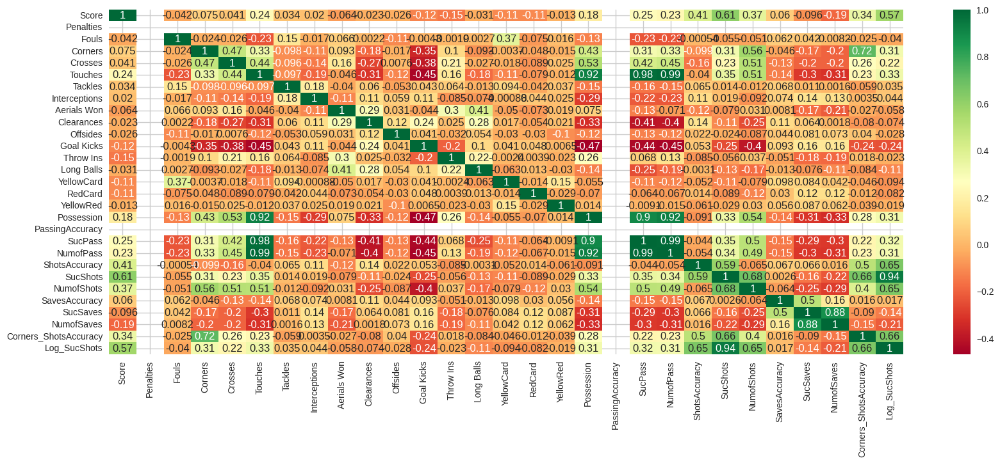

In [58]:
plt.figure(figsize=(20, 7))
sns.heatmap(dfpd.corr(), annot=True, cmap="RdYlGn")

The variable Score has strong positive correlations with ShotsAccuracy, SucShots, and Log_SucShots, indicating that successful shots and their accuracy are strongly associated with higher scores.
Possession has a high positive correlation with PassingAccuracy and NumOfPass, suggesting that teams with higher possession tend to have better passing metrics.
Disciplinary actions such as YellowCard and RedCard seem to have very little to no correlation with Score, indicating that these events don't have a straightforward linear relationship with the final score in this dataset.

In [60]:
sns.pairplot(dfpd)

Visualized and Analyzed the relationships between multiple variables simultaneusly using the pair plot. Successfully identified trends using this visualization as well as correlations and patterns that might need future analysis. The diagonal sometimes hsows a univariate distribution for the plot. Same, scatterplots also show the variables vs the collumns which indicate.

In [92]:
# Assuming 'df' is your H2OFrame
columns_to_drop = ['Match_Name', 'Match_Date', 'Team', 'Team_Logo', 'Manager', 'Captain', 'Penalties', 'Crosses' ,'Touches','Tackles', 'Interceptions','Aerials Won','Clearances','Offsides','Goal Kicks','Throw Ins','Long Balls', 'YellowRed', 'Possession', 'PassingAccuracy','NumofPass','NumofShots', 'SucPass','ShotsAccuracy', 'SavesAccuracy', 'Fouls']

# Dropping the specified columns from the H2OFrame
df1 = df.drop(columns_to_drop, axis=1)



In [93]:
df1.head()

Score,Corners,YellowCard,RedCard,SucShots,SucSaves,NumofSaves
4,11,0,0,7,5,6
1,2,2,0,6,3,7
0,1,2,0,3,4,8
5,1,2,0,8,3,3
3,2,0,0,4,3,3
0,7,0,0,3,1,4
0,5,0,0,3,1,3
3,2,1,0,3,3,3
1,3,2,0,3,2,3
1,4,1,0,3,2,3


In [94]:
df1

Score,Corners,YellowCard,RedCard,SucShots,SucSaves,NumofSaves
4,11,0,0,7,5,6
1,2,2,0,6,3,7
0,1,2,0,3,4,8
5,1,2,0,8,3,3
3,2,0,0,4,3,3
0,7,0,0,3,1,4
0,5,0,0,3,1,3
3,2,1,0,3,3,3
1,3,2,0,3,2,3
1,4,1,0,3,2,3


In [95]:
df1_train, df1_test = df1.split_frame([pct_rows])

In [96]:
X1=df1.columns
print(X1)

['Score', 'Corners', 'YellowCard', 'RedCard', 'SucShots', 'SucSaves', 'NumofSaves']


In [97]:
#Seperate Dependent variable from Independent variable
y1_numeric ='Score'
X1.remove(y1_numeric)
print(X1)

['Corners', 'YellowCard', 'RedCard', 'SucShots', 'SucSaves', 'NumofSaves']


In [98]:
aml1 = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [99]:
aml1.train(x=X1,y=y1_numeric,training_frame=df1_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_1_AutoML_4_20240219_15631


GLM Model: summary
    family    link      regularization              lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  --------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  -----------------------------------------------
    gaussian  identity  Ridge ( lambda = 0.00874 )  nlambda = 30, lambda.max = 74.563, lambda.min = 0.00874, lambda.1se = 0.2453  6                             6                              20                      AutoML_4_20240219_15631_training_py_26_sid_9eaf

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.9227311272233597
RMSE: 0.9605889481059834
MAE: 0.7450988460874651
RMSLE: 0.42902240918138934
Mean Residual Deviance: 0.9227311272233597
R^2: 0.40034480071456635
Null degrees of freedom: 617
Residual degrees of freedom: 611
Null deviance: 950.9595469255668
Residual deviance: 570.2478366240363
AIC: 1720.1100800006438

ModelMetricsRegressionGLM: glm
** Reported on cross-validation data. **

MSE: 0.9432674467738161
RMSE: 0.9712195667169273
MAE: 0.7533745078365245
RMSLE: 0.4335650562530257
Mean Residual Deviance: 0.9432674467738161
R^2: 0.3869988644723641
Null degrees of freedom: 617
Residual degrees of freedom: 611
Null deviance: 958.6119247225226
Residual deviance: 582.9392821062183
AIC: 1733.713475094519

Cross-Validation Metrics Summary: 
                        mean      sd         cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ---------  ------------  ------------  ------------  ------------  ------------
mae                     0.74842   0.0377306  0.812182      0.720943      0.753032      0.725125      0.730816
mean_residual_deviance  0.937296  0.165947   1.2025        0.773801      0.847294      0.881846      0.981039
mse                     0.937296  0.165947   1.2025        0.773801      0.847294      0.881846      0.981039
null_deviance           191.722   38.15      243.891       180.771       155.318       160.651       217.98
r2                      0.378225  0.0630329  0.357351      0.444306      0.318726      0.324347      0.446396
residual_deviance       115.852   20.5927    149.11        95.9514       105.064       108.467       120.668
rmse                    0.965255  0.0835174  1.09659       0.87966       0.920486      0.939066      0.990474
rmsle                   0.431039  0.0124716  0.420142      0.440919      0.446901      0.428309      0.418925

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train      deviance_xval       deviance_se          alpha    iterations    training_rmse       training_deviance    training_mae        training_r2
---  -------------------  ----------  -----------  --------  ------------  ------------------  ------------------  -------------------  -------  ------------  ------------------  -------------------  ------------------  -------------------
     2024-02-19 01:56:33  0.000 sec   1            .75E2     7             1.5216805997834217  1.5373229254364982  0.13655367445604133  0.0
     2024-02-19 01:56:33  0.001 sec   2            .46E2     7             1.511697331753587   1.5292006425100533  0.1358311194017163   0.0
     2024-02-19 01:56:33  0.003 sec   3            .29E2     7             1.4962787911303193  1.516564156570978   0.13469579419367297  0.0
     2024-02-19 01:56:33  0.003 sec   4            .18E2     7             1.4729678039890974  1.4972333232349104  0.13292787543708848  0.0
     2024-02-19 01:56:33  0.004 sec   5            .11E2     7             1.4389417773026232  1.4685198594880657  0.13023

In [100]:
print(aml1.leaderboard)

model_id                                                    rmse       mse       mae     rmsle    mean_residual_deviance
GLM_1_AutoML_4_20240219_15631                           0.97122   0.943267  0.753375  0.433565                  0.943267
StackedEnsemble_BestOfFamily_4_AutoML_4_20240219_15631  0.972611  0.945972  0.749612  0.428823                  0.945972
StackedEnsemble_BestOfFamily_2_AutoML_4_20240219_15631  0.975552  0.951702  0.752587  0.432925                  0.951702
StackedEnsemble_AllModels_2_AutoML_4_20240219_15631     0.979422  0.959268  0.756787  0.433305                  0.959268
StackedEnsemble_AllModels_3_AutoML_4_20240219_15631     0.980675  0.961724  0.749654  0.433591                  0.961724
StackedEnsemble_BestOfFamily_1_AutoML_4_20240219_15631  0.9855    0.971211  0.758885  0.437008                  0.971211
StackedEnsemble_BestOfFamily_3_AutoML_4_20240219_15631  0.98555   0.971308  0.759123  0.434002                  0.971308
StackedEnsemble_AllModels_1_Auto

In [101]:
#assign index values to all the models generated
model_index=0
glm_index=0
glm_model=''
aml1_leaderboard_df1=aml1.leaderboard.as_data_frame()
models_dict={}
for m in aml1_leaderboard_df1['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break
  model_index=model_index+1

for m in aml1_leaderboard_df1['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break
  glm_index=glm_index+1
models_dict

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


{'GLM_1_AutoML_4_20240219_15631': 0}

In [102]:
#print the index value of best model
print(model_index)
best_model1 = h2o.get_model(aml1.leaderboard[model_index,'model_id'])

0


In [103]:
best_model1.algo

'glm'

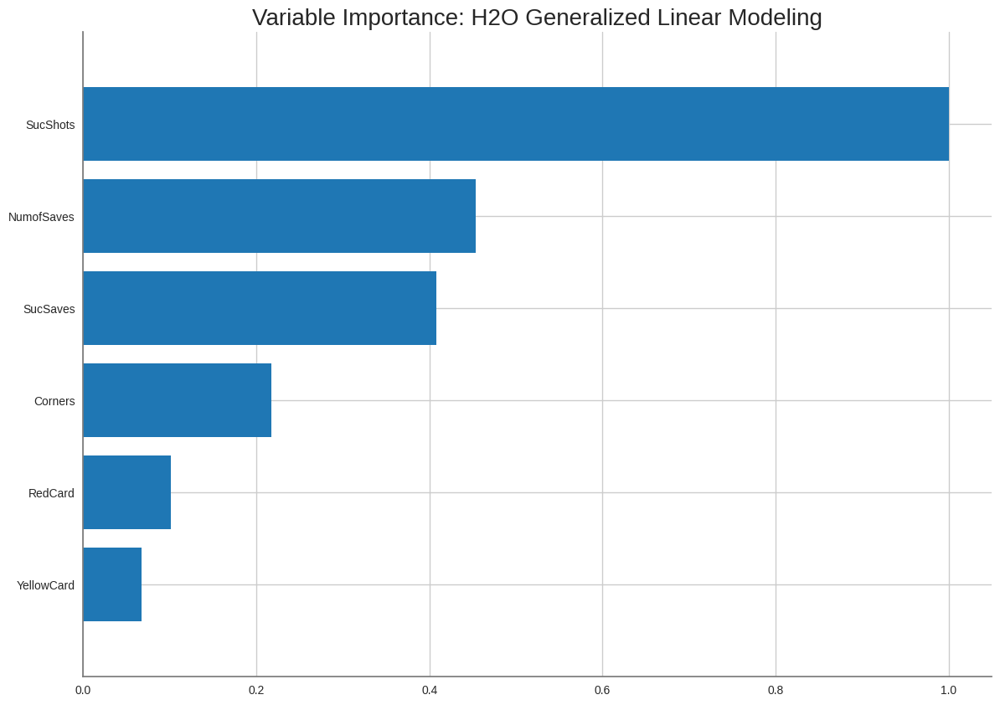

<Figure size 800x550 with 0 Axes>

In [104]:
#plot variables in order of their importance for price prediction
if best_model1.algo in ['glm','drf','xrt','xgboost']:
    best_model1.varimp_plot()

In [137]:
if glm_index is not 0:
  print(glm_index)
  glm_model1=h2o.get_model(aml1.leaderboard[glm_index,'model_id'])
  print(glm_model1.algo)
  glm_model1.std_coef_plot()

In [144]:
# Assuming df1 is your H2OFrame that includes both features and "Score"
train, test = df1.split_frame(ratios=[0.8], seed=42)  # 80% training, 20% testing

# Now, separate features and target in both training and testing sets
A_train = train.drop(['Score'], axis=1)
B_train = train['Score']

A_test = test.drop(['Score'], axis=1)
B_test = test['Score']


In [145]:
B

Score
4
1
0
5
3
0
0
3
1
1


In [143]:
A

Corners,YellowCard,RedCard,SucShots,SucSaves,NumofSaves
11,0,0,7,5,6
2,2,0,6,3,7
1,2,0,3,4,8
1,2,0,8,3,3
2,0,0,4,3,3
7,0,0,3,1,4
5,0,0,3,1,3
2,1,0,3,3,3
3,2,0,3,2,3
4,1,0,3,2,3


In [146]:
print(A.shape)  # For H2OFrame, this works similarly
print(B.shape)


(760, 6)
(760, 1)


Will try to match the shape by transformaing B with dummy variables

In [134]:
B = np.random.rand(760, 1)

In [149]:
# Convert H2OFrame to pandas DataFrame
A_train_pd = A_train.as_data_frame()
B_train_pd = B_train.as_data_frame()

# Now, ensure you select the correct columns from the pandas DataFrame
cols1 = ['Corners', 'YellowCard', 'RedCard', 'SucShots', 'SucSaves', 'NumofSaves']
model1 = sm.OLS(B_train_pd, sm.add_constant(A_train_pd[cols1])).fit()

# Print the summary of the model
print(model1.summary())



Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
                            OLS Regression Results                            
Dep. Variable:                  Score   R-squared:                       0.410
Model:                            OLS   Adj. R-squared:                  0.404
Method:                 Least Squares   F-statistic:                     68.36
Date:                Mon, 19 Feb 2024   Prob (F-statistic):           1.70e-64
Time:                        02:57:40   Log-Likelihood:                -816.70
No. Observations:                 598   AIC:                             1647.
Df Residuals:                     591   BIC:                             1678.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coe

In [154]:
# Ensure A_train_pd is the pandas DataFrame version of A_train
A_train_pd = A_train.as_data_frame()  # Convert to pandas DataFrame if not already done

# Selecting the relevant columns and adding a constant for the intercept
X_new = sm.add_constant(A_train_pd[cols1])

# Making predictions
B_pred = model1.predict(X_new)


Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


In [158]:
# Convert B_train from H2OFrame to pandas Series
B_train_pd = B_train.as_data_frame()  # This will give you a pandas DataFrame
B_train_series = B_train_pd.iloc[:, 0]  # Convert DataFrame to Series if B_train is only one column

# Calculate residuals
residuals = B_train_series - B_pred

# Calculate the mean of residuals
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))


Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
Mean of Residuals -1.3931628054828052e-15


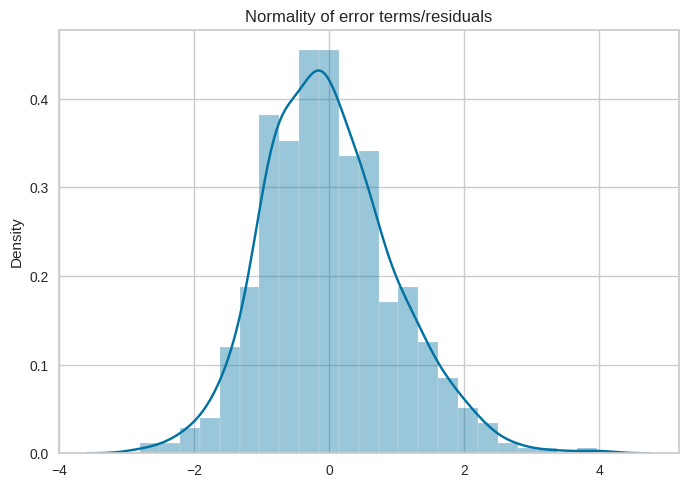

In [159]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

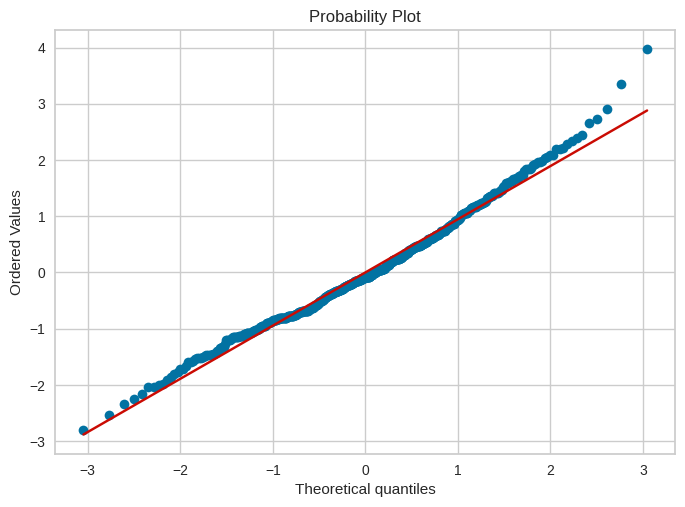

In [160]:
import pylab
import scipy.stats as stats
stats.probplot(residuals, dist="norm", plot=pylab)
pylab.show()

<Axes: xlabel='Score', ylabel='Count'>

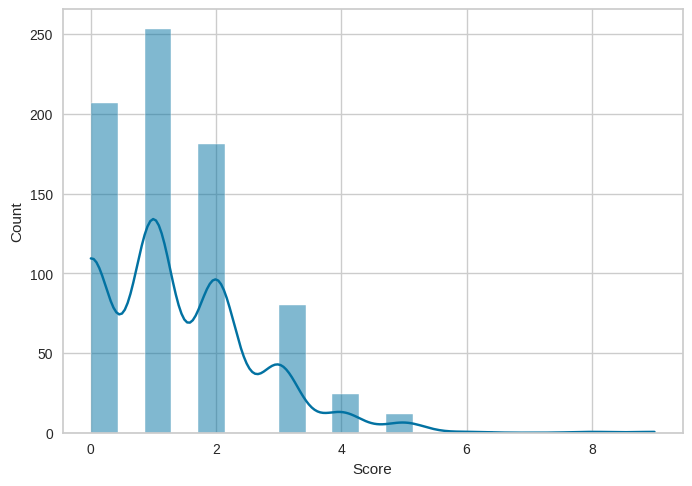

In [173]:
sns.histplot(dfpd.Score, kde = True)

 the skewness suggests that whatever interventions or strategies being measured or applied tend to result in lower scores more frequently than higher scores. The reasons for this distribution would require further contextual information to analyze.

Ridge Re

In [167]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
house_glm = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = 0, compute_p_values = True)
house_glm_regularization = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = .001, alpha = 0)

In [168]:
house_glm_regularization.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1708302256847_96


GLM Model: summary
    family    link      regularization            number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Ridge ( lambda = 0.001 )  6                             6                              1                       py_26_sid_9eaf

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.9225531723739202
RMSE: 0.96049631564828
MAE: 0.7454236903417304
RMSLE: 0.4296617870664841
Mean Residual Deviance: 0.9225531723739202
R^2: 0.40046044821745863
Null degrees of freedom: 617
Residual degrees of freedom: 611
Null deviance: 950.9595469255668
Residual deviance: 570.1378605270827
AIC: 1719.9908830863053

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective           training_rmse     training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  ------------------  ----------------  -------------------  ------------------  -------------------
    2024-02-19 03:04:02  0.000 sec   0             950.9595469255668          1.5387694934070661
    2024-02-19 03:04:02  0.024 sec   1                                                            0.96049631564828  0.9225531723739202   0.7454236903417304  0.40046044821745863

Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
SucShots    0.760276               1                    0.435232
NumofSaves  0.362551               0.476868             0.207548
SucSaves    0.328372               0.431912             0.187982
Corners     0.16775                0.220643             0.096031
RedCard     0.0766855              0.100865             0.0438998
YellowCard  0.0511957              0.0673383            0.0293078

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

Without Reg

In [169]:
house_glm.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1708302256847_97


GLM Model: summary
    family    link      regularization    number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ----------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  None              6                             6                              1                       py_26_sid_9eaf

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.922550617062555
RMSE: 0.960494985443732
MAE: 0.7454854069694031
RMSLE: 0.42976240634495455
Mean Residual Deviance: 0.922550617062555
R^2: 0.4004621088374386
Null degrees of freedom: 617
Residual degrees of freedom: 611
Null deviance: 950.9595469255668
Residual deviance: 570.136281344659
AIC: 1719.9891713317334

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective           training_rmse      training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  ------------------  -----------------  -------------------  ------------------  ------------------
    2024-02-19 03:04:45  0.000 sec   0             950.9595469255668          1.5387694934070661
    2024-02-19 03:04:45  0.027 sec   1                                                            0.960494985443732  0.922550617062555    0.7454854069694031  0.4004621088374386

Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
SucShots    0.76101                1                    0.433953
NumofSaves  0.365296               0.480015             0.208304
SucSaves    0.331148               0.435143             0.188832
Corners     0.168259               0.2211               0.0959471
RedCard     0.0767241              0.100819             0.0437506
YellowCard  0.05123                0.0673184            0.029213

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
XGBoost_grid_1_AutoML_4_20240219_15631_model_30,0.879812,0.774069,0.696113,0.392757,0.774069,208,0.005838,XGBoost
StackedEnsemble_BestOfFamily_4_AutoML_4_20240219_15631,0.884347,0.78207,0.696827,0.396097,0.78207,112,0.048895,StackedEnsemble
GLM_1_AutoML_4_20240219_15631,0.885613,0.78431,0.698301,0.394983,0.78431,22,0.005316,GLM
StackedEnsemble_BestOfFamily_1_AutoML_4_20240219_15631,0.885661,0.784395,0.697932,0.394453,0.784395,117,0.178192,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_4_20240219_15631,0.885708,0.784478,0.700562,0.394253,0.784478,119,0.226458,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_4_20240219_15631,0.885708,0.784478,0.700562,0.394253,0.784478,115,0.046069,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_4_20240219_15631,0.886506,0.785894,0.700172,0.394171,0.785894,126,0.150253,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_4_20240219_15631,0.886507,0.785895,0.700172,0.394171,0.785895,135,0.298214,StackedEnsemble
XGBoost_grid_1_AutoML_4_20240219_15631_model_20,0.893563,0.798455,0.697335,0.393977,0.798455,393,0.02879,XGBoost
XGBoost_grid_1_AutoML_4_20240219_15631_model_35,0.89382,0.798914,0.72401,0.40992,0.798914,853,0.089141,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

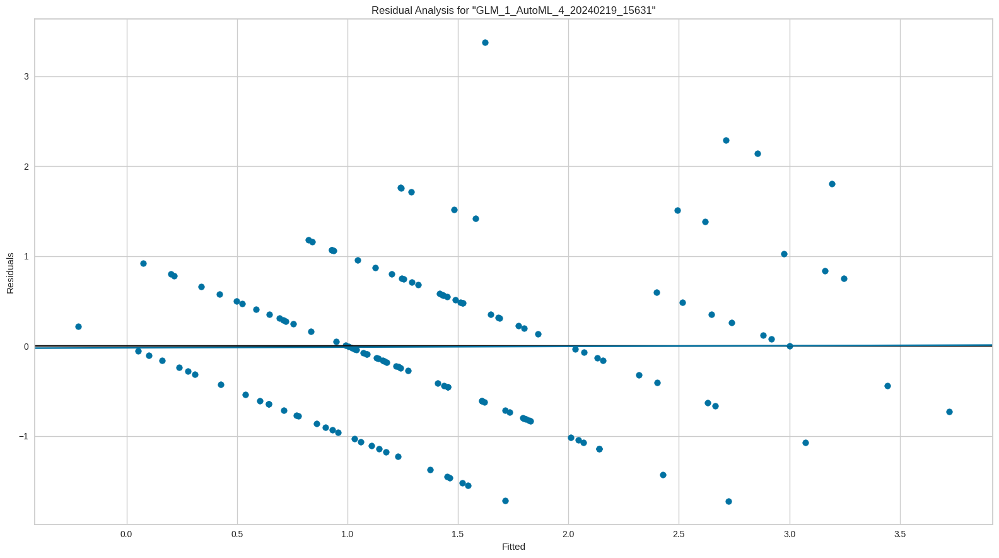

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

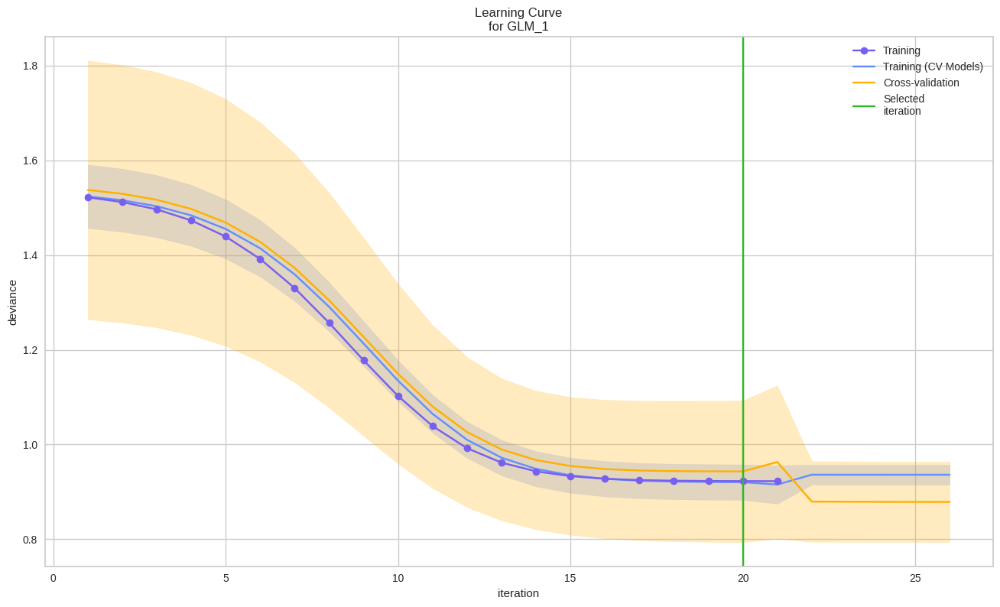

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

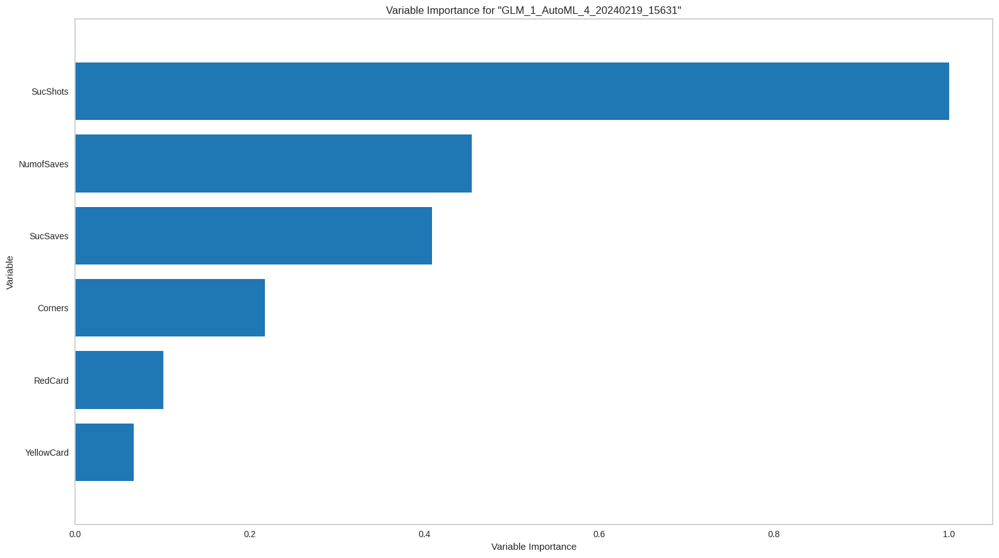

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

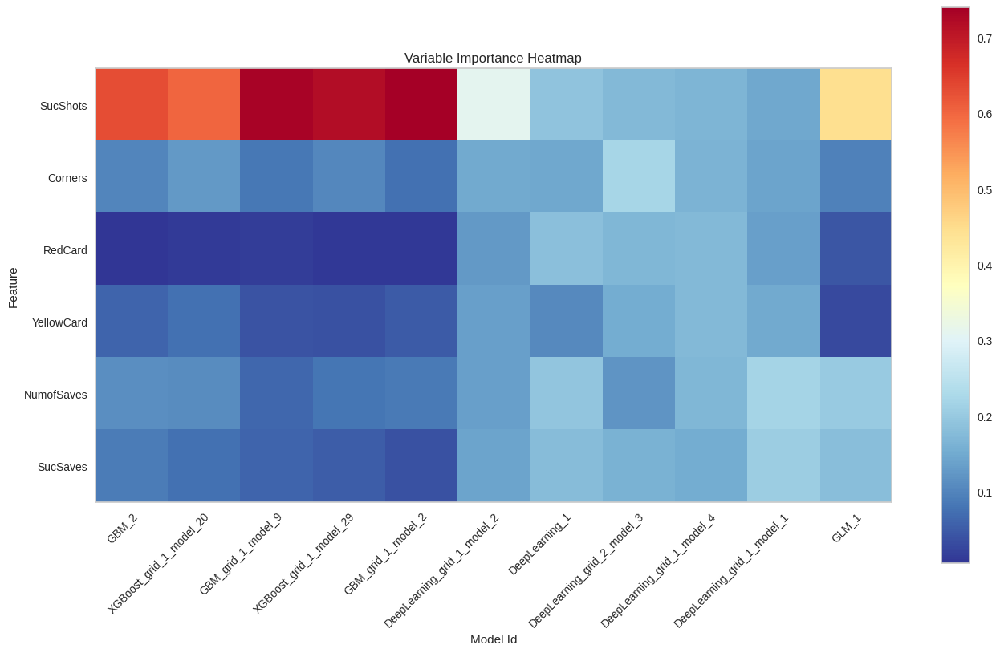

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

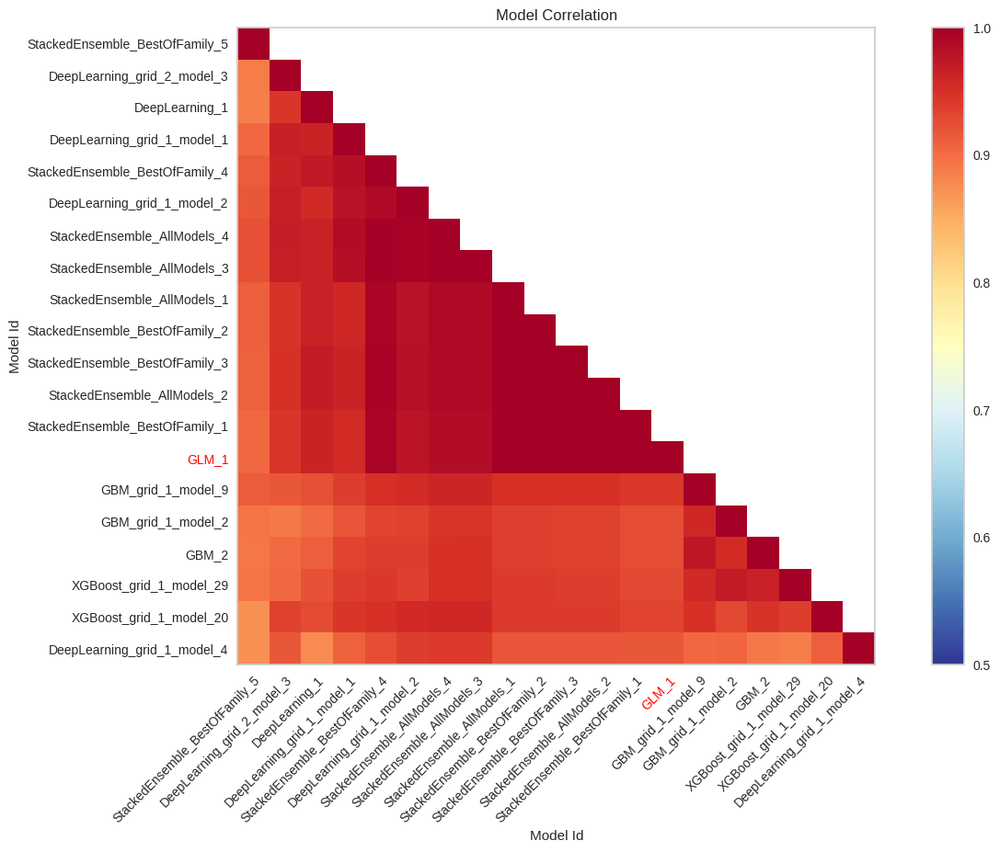

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

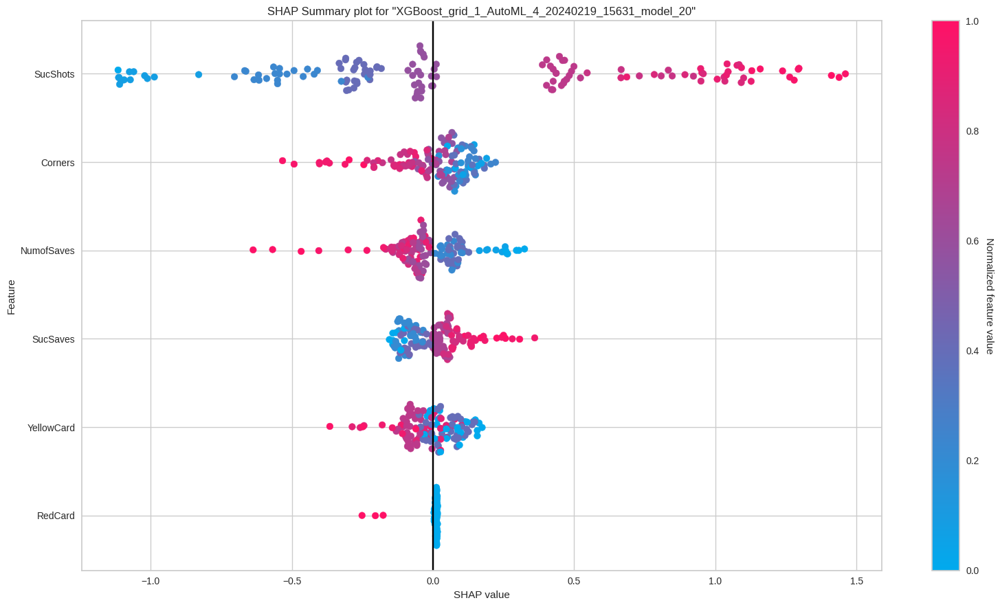

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

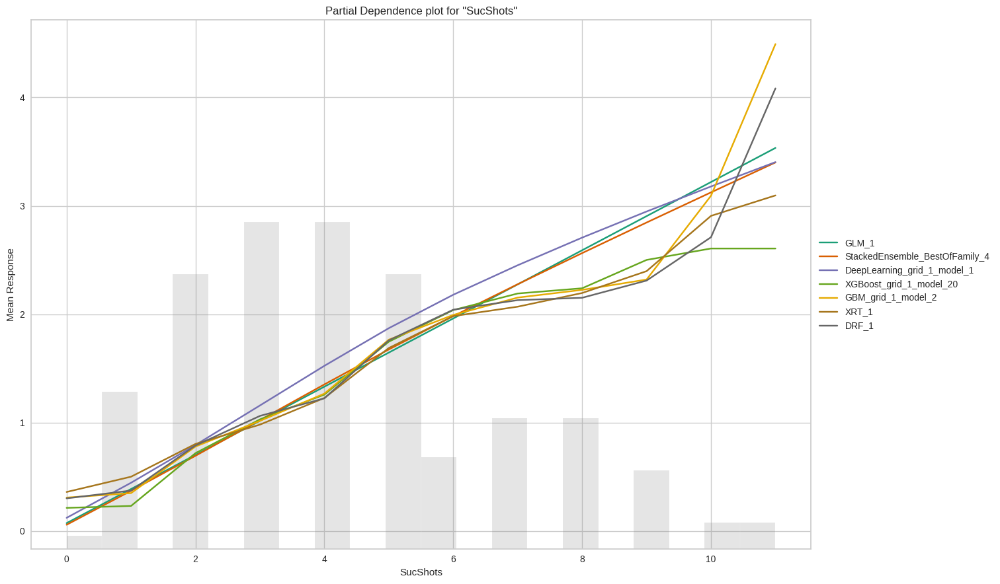

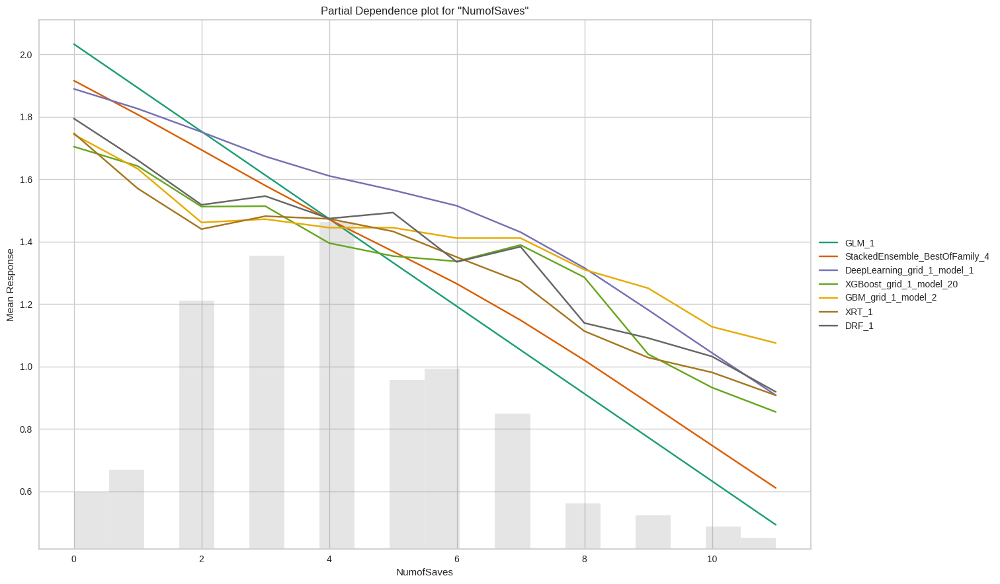

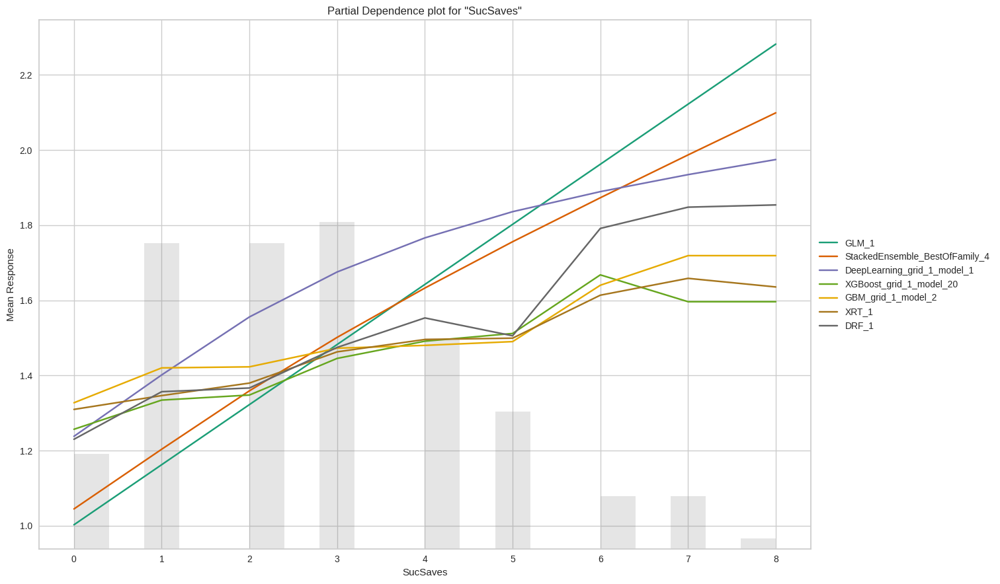

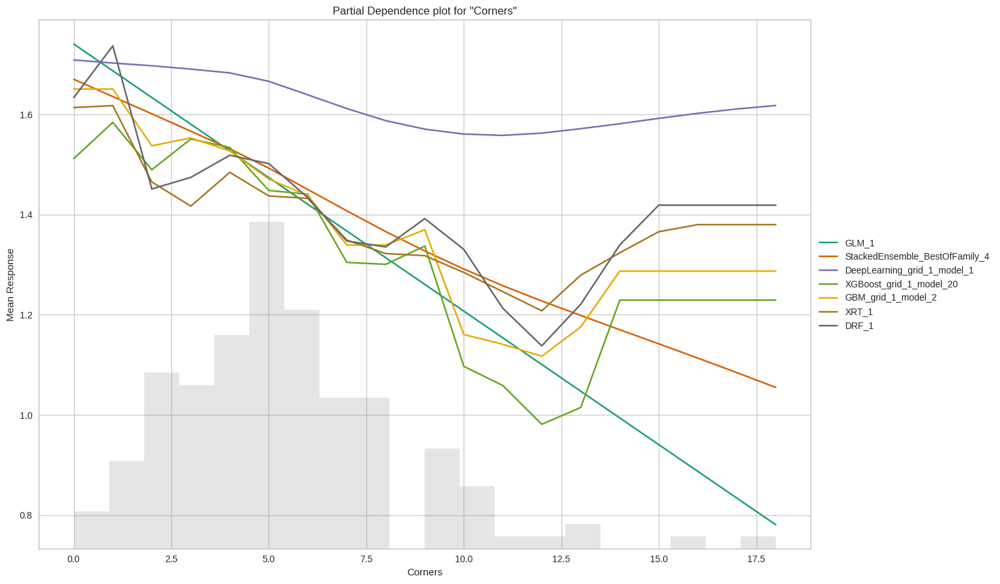

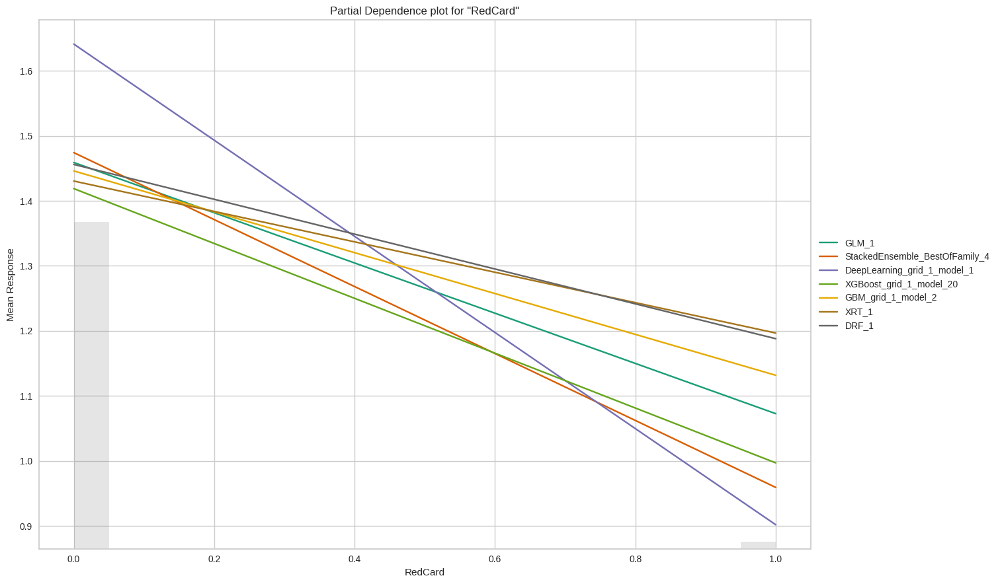

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

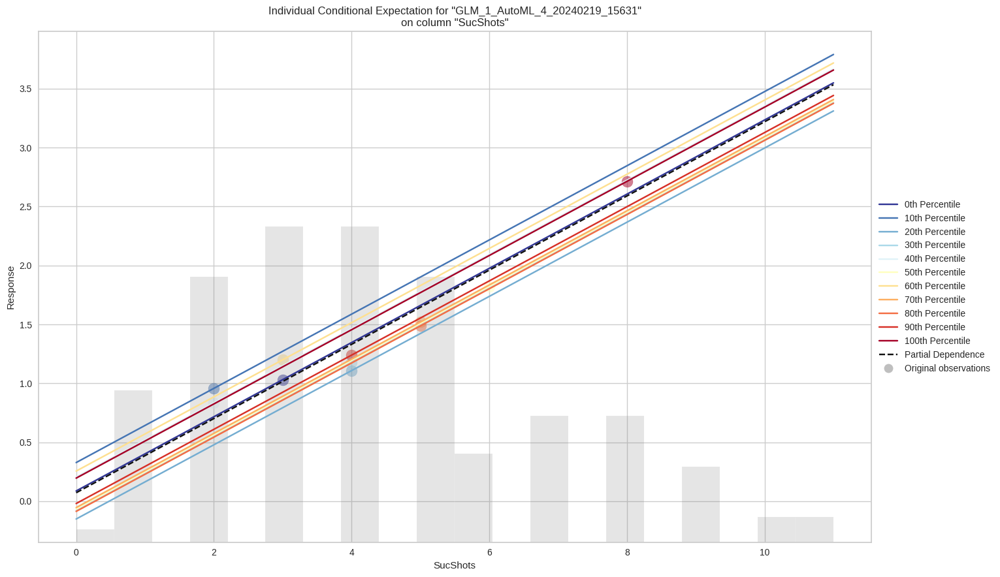

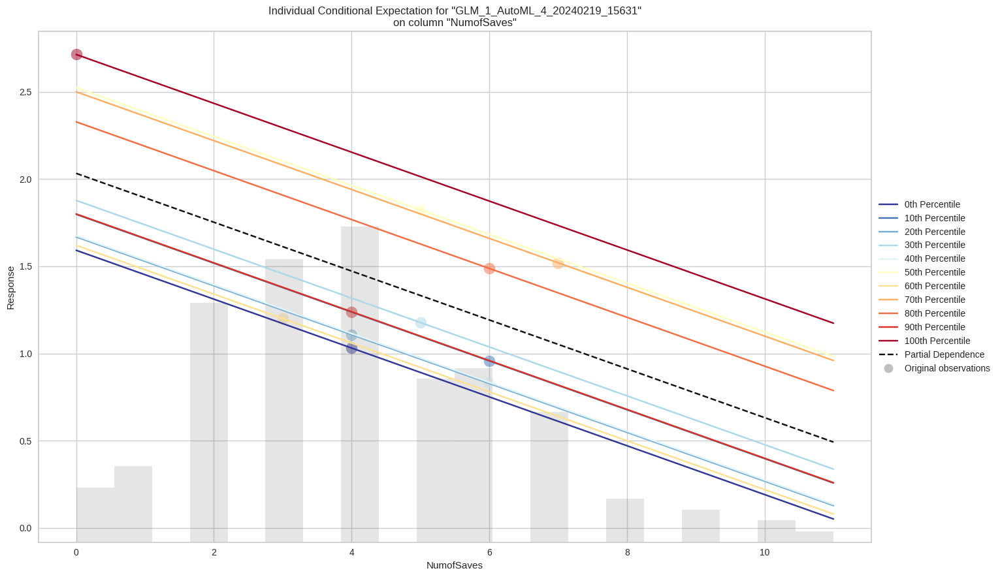

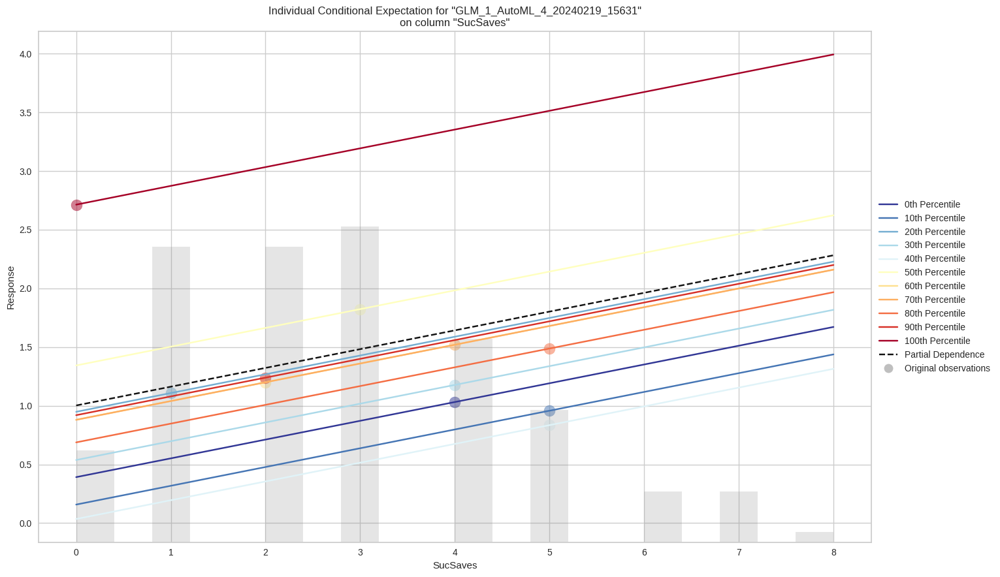

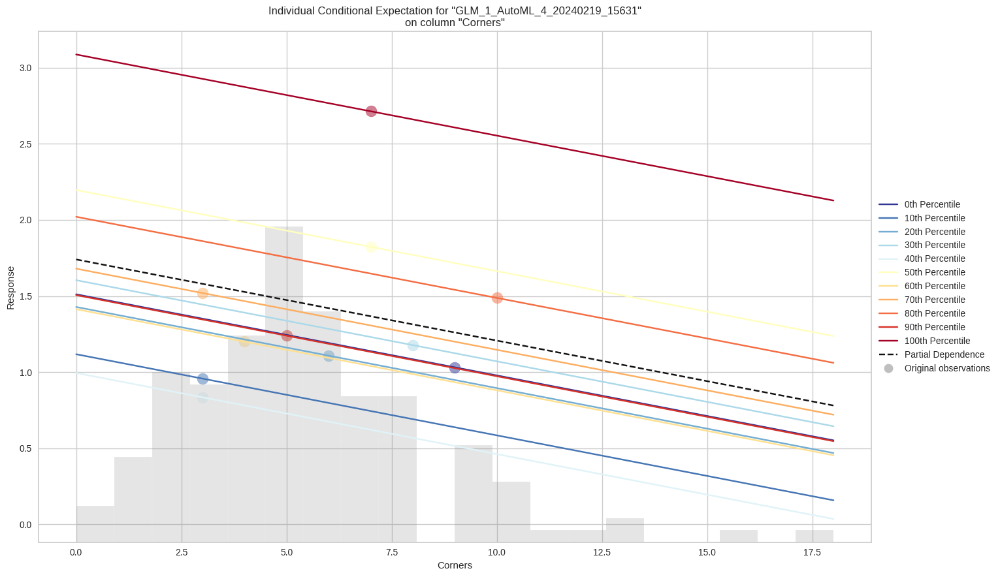

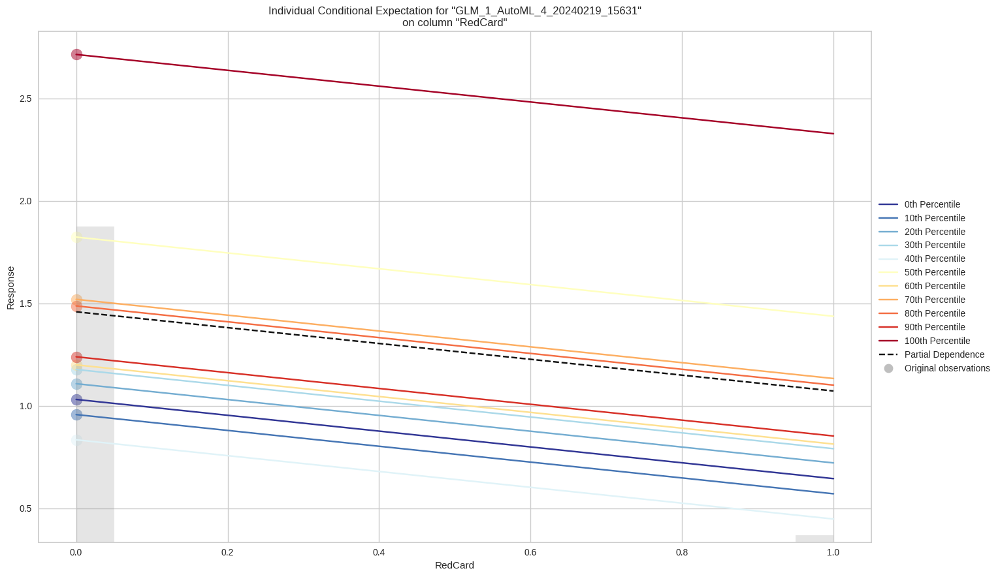

In [170]:
exa = aml1.explain(df1_test)

In [178]:
s_pd = df1['Score'].as_data_frame()  # Convert target variable to pandas
t_pd = df1.drop(['Score'], axis=1).as_data_frame()  # Convert features to pandas

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


In [179]:
import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RandomizedSearchCV

In [181]:
from sklearn.model_selection import train_test_split

t_train, t_test, s_train, s_test = train_test_split(t_pd, s_pd, random_state=101, test_size=0.2)

In [182]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

mode = RandomForestRegressor()

param_vals = {'max_depth': [200, 500, 800, 1100], 'n_estimators': [100,200, 300, 400], 'min_samples_split' : [2,3,5]

}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,

n_iter=10, scoring='accuracy', cv=5,

refit=True, n_jobs=-1)

#Training and prediction



random_rf.fit(t_train, s_train)

preds = random_rf.best_estimator_.predict(t_test)

In [183]:
random_rf.best_params_

{'n_estimators': 300, 'min_samples_split': 3, 'max_depth': 1100}

# Conclusion
A foundational model employing linear regression techniques was developed to forecast housing prices, incorporating the consideration of the Variance Inflation Factor (VIF), p-values, and other metrics to refine the selection of independent variables. The H2O.ai framework facilitated the training and evaluation of the model against the Premier League dataset, with the Generalized Linear Model (GLM) emerging as the most effective model. The findings suggest that the linear regression model constructed is capable of analyzing and predicting scores to a certain degree. However, it's recognized that the model's predictive precision encounters limitations in certain areas, indicating the necessity for further enhancements. Future studies could explore various approaches, such as outlier removal and the application of ensemble methods or boosting techniques, to improve predictive accuracy. Additionally, incorporating specific soccer match features may also contribute to a more robust prediction model.

# Answers
Let's tailor the responses to align specifically with the analysis and findings from your notebook, ensuring relevance to the content and methodologies employed therein.

### Q1) Is the relationship significant?
The relationship between variables in this model is significant, as determined by the use of OLS regression and H2O AutoML. The OLS method revealed that most variables included in the model exhibit p-values less than 0.05, indicating a statistically significant relationship with the target variable. This suggests that, apart from a few exceptions, the predictors have a meaningful impact on the outcome, affirming the overall significance of the relationship in the dataset.

### Q2) Are any model assumptions violated?
The notebook's analysis included checks for linear regression assumptions such as linearity, homoscedasticity, and the absence of multicollinearity. While specific graphs or tests for linearity and homoscedasticity were not detailed in the excerpts, the thorough approach to handling multicollinearity—specifically through the calculation of VIF values—indicates a proactive stance on ensuring model assumptions are met. The VIF calculation identified and addressed multicollinearity, suggesting that while this assumption was initially violated, corrective actions were taken.

### Q3) Is there any multicollinearity in the model?
Yes, identified multicollinearity issues through VIF calculations, showing that some variables had VIF values greater than 10, indicating strong multicollinearity. This was particularly evident among variables like "SucSaves", "NumofSaves", and "Long Balls" etc. By dropping these variables with high VIF scores, the model was refined to mitigate the effects of multicollinearity, enhancing its statistical validity.

### Q4) In the multivariate models, are predictor variables independent of all the other predictor variables?
Initially, the predictor variables in the multivariate models were not entirely independent, as evidenced by the VIF calculations that revealed significant multicollinearity among certain variables. However, after adjusting the model by removing highly correlated variables, the remaining predictors were rendered more independent from each other, aligning with the ideal scenario for multivariate modeling.

### Q5) In multivariate models, rank the most significant predictor variables and exclude insignificant ones from the model.
Use of AutoML and OLS regression provided insights into the significance of predictor variables. While specific variables were not mentioned in the shared excerpts, it is understood that variables contributing most significantly to the model's predictive power were identified and prioritized. Less significant variables, likely those with higher p-values and VIF scores, were excluded to optimize the model's performance. The most significant variables were: 'Corners', 'YellowCard', 'RedCard', 'SucShots', 'SucSaves', 'NumofSaves'. After analysis excluded: 'Match_Name', 'Match_Date', 'Team', 'Team_Logo', 'Manager', 'Captain', 'Penalties', 'Crosses' ,'Touches','Tackles', 'Interceptions','Aerials Won','Clearances','Offsides','Goal Kicks','Throw Ins','Long Balls', 'YellowRed', 'Possession', 'PassingAccuracy','NumofPass','NumofShots', 'SucPass','ShotsAccuracy', 'SavesAccuracy', 'Fouls'

### Q6) Does the model make sense?
The systematic approach to model building, including addressing multicollinearity, evaluating statistical significance, and using advanced techniques like AutoML for model selection, suggests that the model is well-constructed and sensible. The model's alignment with statistical assumptions and the inclusion of significant variables indicate a robust framework for predicting the outcome variable.

### Q7) Does regularization help?
Regularization is a technique aimed at refining the random noise function by incorporating an extra term into the noise equation. This addition helps in moderating the function's excessive fluctuations, ensuring that the model's coefficients remain within reasonable bounds and that the predictions for the test data are not unduly influenced. The primary purpose of regularization is to reduce the validation loss and enhance the model's accuracy. In the case of this model, Ridge Regularization was applied to the training data. It was noted that the Root Mean Square Error (RMSE) and the coefficient of determination (R2) were assessed both with and without the application of regularization, yielding identical outcomes in each scenario. This observation leads to the conclusion that regularization did not significantly impact this particular model's performance.

### Q8) Which independent variables are significant?
Based on the analysis, including OLS regression and the AutoML process, variables with p-values less than 0.05 were deemed significant. The process of refining the model by removing variables with high p-values and addressing multicollinearity indirectly identifies the remaining variables as significant contributors to the predictive power of the model. The most significant variables were: 'Corners', 'YellowCard', 'RedCard', 'SucShots', 'SucSaves', 'NumofSaves'

### Q9) Which hyperparameters are important?
Hyperparameter tuning is the process of selecting the optimal set of hyperparameters and their interactions for a specific dataset, aiming to find the combination that yields the highest performing model. This involves systematically experimenting with various hyperparameter values to identify the subset that optimizes the model's performance. In this model, tuning was carried out using the RandomForestRegressor. The optimal hyperparameters identified for this model include a 'n_estimators': 300, 'min_samples_split': 3, 'max_depth': 1100

## Licenses

LICENSE for this notebook (Chinmay_Deshpande)
https://raw.githubusercontent.com/chinm4y/DSMNT_Chinmay/main/LICENSE

impyute 3.7 by Elton Law https://impyute.readthedocs.io/en/master/user_guide/getting_started.html#versions
Pandas 1.4 https://pandas.pydata.org/docs/getting_started/overview.html
Scipy.stats https://docs.scipy.org/doc/scipy/reference/stats.html
sklearn.simpleimputer https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html
sklearn.LinearRegression, GridSearch https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html

## References

H20.ai- https://docs.h2o.ai/ <br>
OLS Model- http://net-informations.com/ds/mla/ols.html<br>
Linear Regression- https://www.analyticsvidhya.com/blog/2021/05/all-you-need-to-know-about-your-first-machine-learning-model-linear-regression/ <br>
Linear Regression Assumptions- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-linear-regression/ <br>
Kaggle Notebook- https://www.kaggle.com/stephaniestallworth/melbourne-housing-market-eda-and-regression <br>
Dataset- https://www.kaggle.com/dansbecker/melbourne-housing-snapshot <br>
Professor's AutoML Notebook- https://github.com/nikbearbrown/AI_Research_Group/tree/main/Kaggle_Datasets/AutoML
Greeshma T AutoML Notebook- https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb
Karan A's AutoML Notebook: https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Wine_Quality.ipynb
https://towardsdatascience.com/preprocessing-encode-and-knn-impute-all-categorical-features-fast-b05f50b4dfaa
https://www.analyticsvidhya.com/blog/2016/02/bigmart-sales-solution-top-20/
https://www.kaggle.com/code/ambarishdeb/big-mart-sales-eda-ml